## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

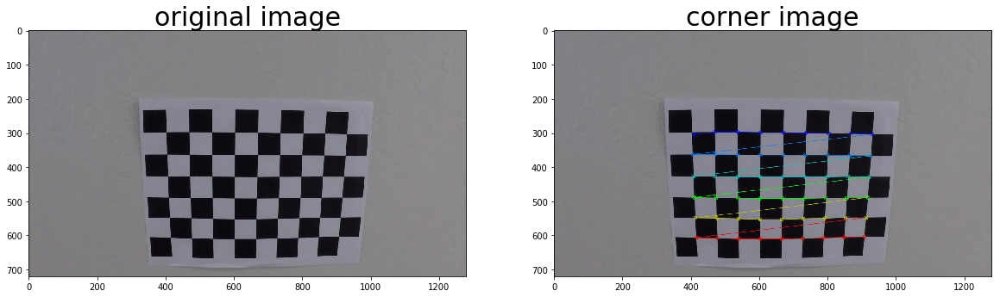

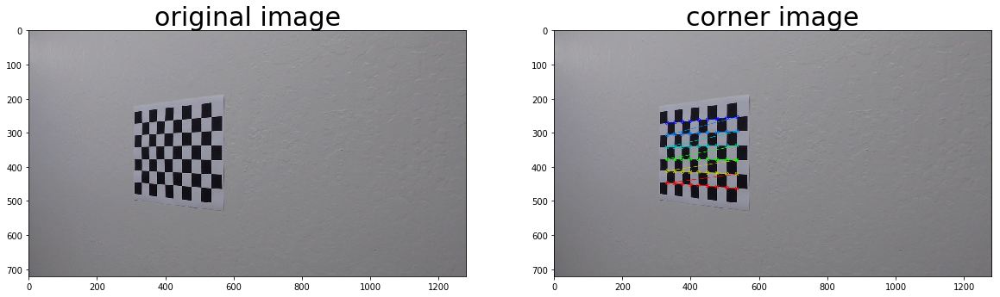

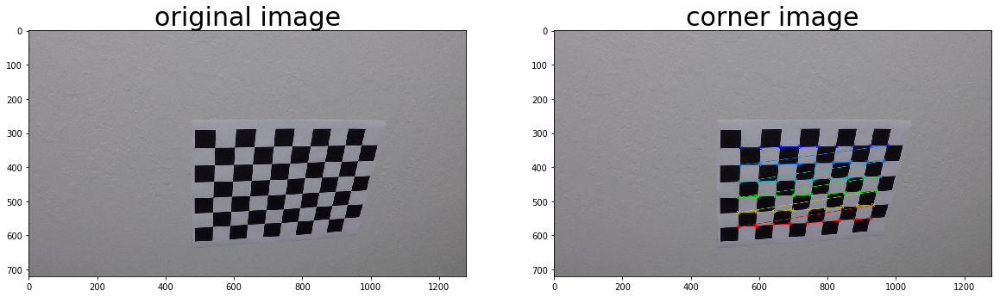

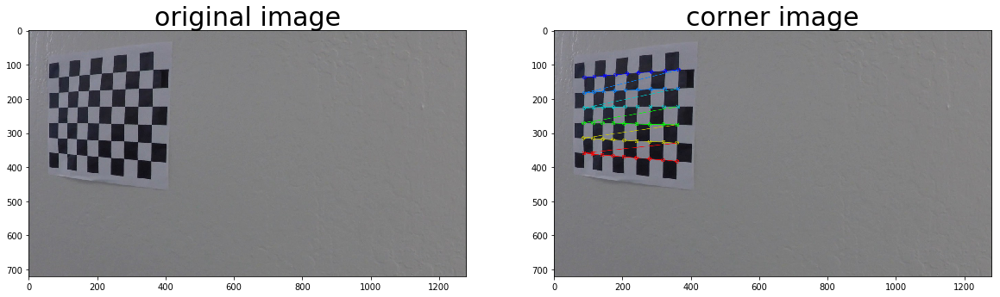

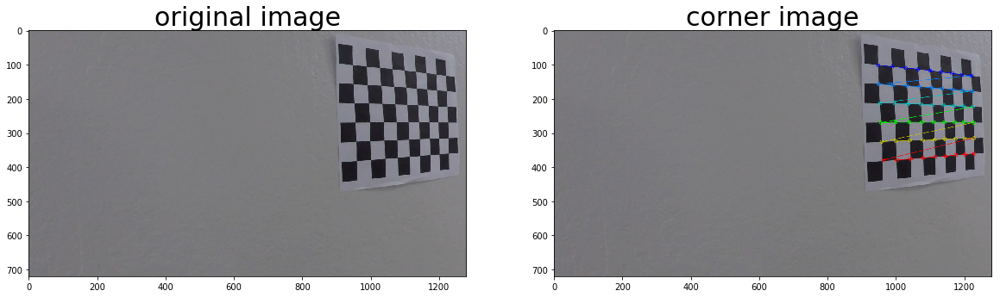

...

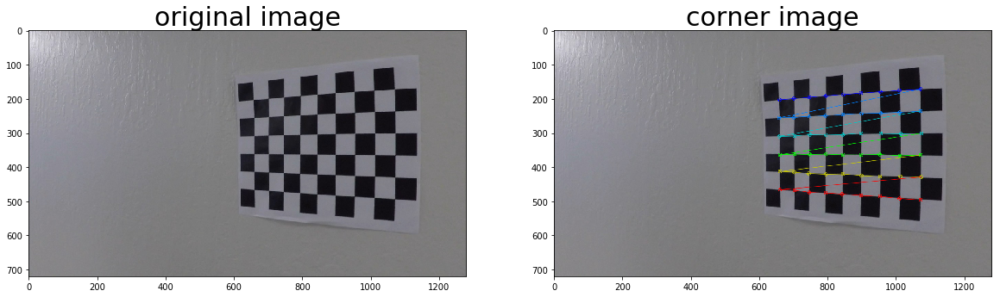

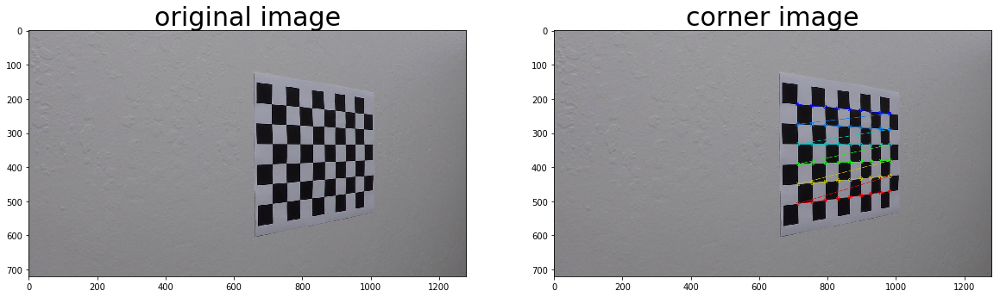

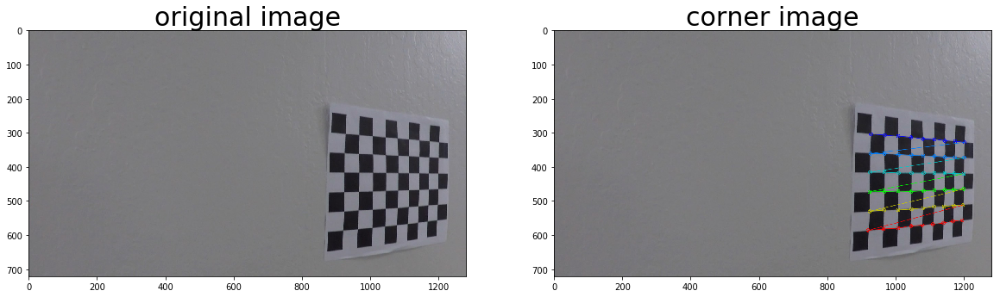

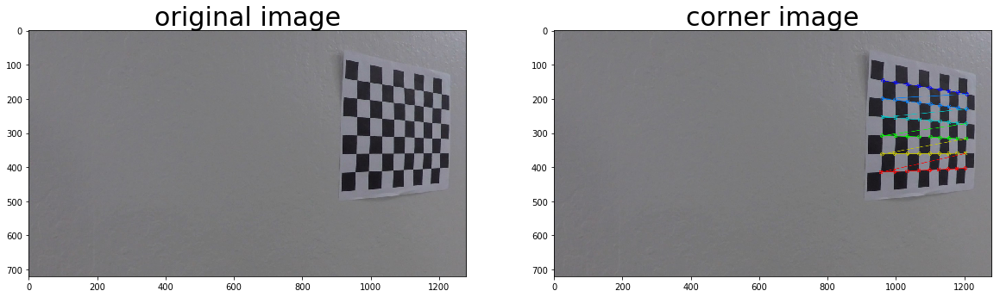

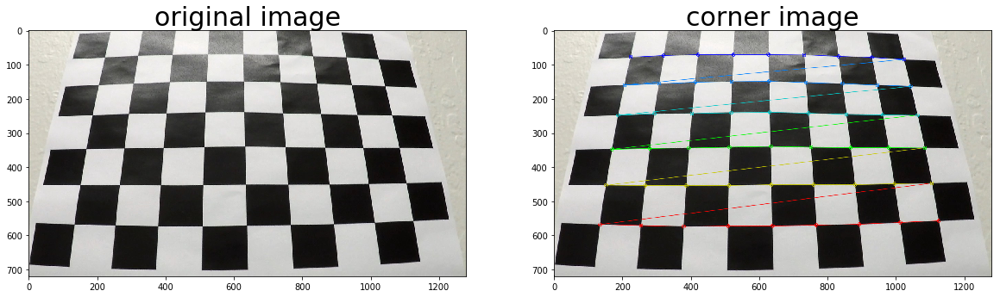

In [38]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from collections import deque
from moviepy.editor import VideoFileClip
%matplotlib inline
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.
# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')
# Step through the list and search for chessboard corners
for fname in images:
    image = mpimg.imread(fname)
    original_image=mpimg.imread(fname)
    #plt.imshow(img)
    gray_image = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    # Find the chessboard corners
    retval, corners = cv2.findChessboardCorners(gray_image, (9,6),None)
    # If found, add object points, image points
    if retval == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        cv2.drawChessboardCorners(image, (9,6), corners, retval)
        f,(ax1,ax2)=plt.subplots(1,2,figsize=(20,10))
        ax1.imshow(original_image)
        ax1.set_title('original image',fontsize=30)
        ax2.imshow(image)
        ax2.set_title('corner image',fontsize=30)
        


## Step1: calibrate camera images and Distortion correction

In [39]:
#undistort the image using camera calibration  and undistort
#For this inputs are objet points and image points, which are finded from previous find chess board
#And output from cameracalibrations are camera matrix and distortion coefficient
#The main output of this function is undistorted image
def undistort(image,show=True,read=True):
    if read:
        image1=mpimg.imread(image)
    imagesize=image1.shape
    retvalue1,cameramatrix,distcoeffs,rvecs,tvecs=cv2.calibrateCamera(objpoints,imgpoints,imagesize[1::-1],None,None)
    dst=cv2.undistort(image1,cameramatrix,distcoeffs,None,cameramatrix)
    if show:
        f,(ax1,ax2)=plt.subplots(1,2,figsize=(20,10))
        ax1.imshow(image1)
        ax1.set_title('original image',fontsize=30)
        ax2.imshow(dst)
        ax2.set_title('undistorted image',fontsize=30)
    else:
        return dst

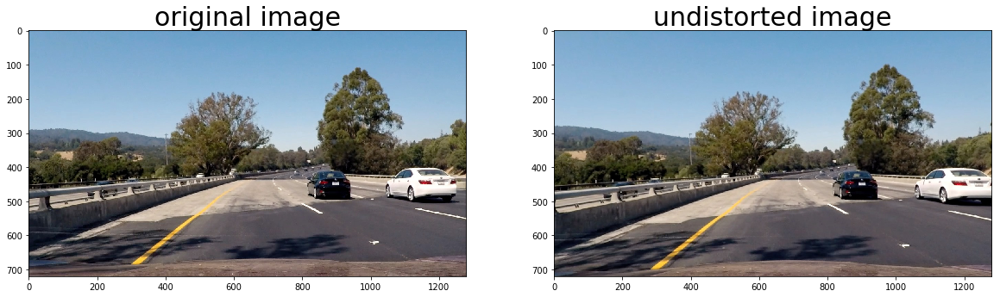

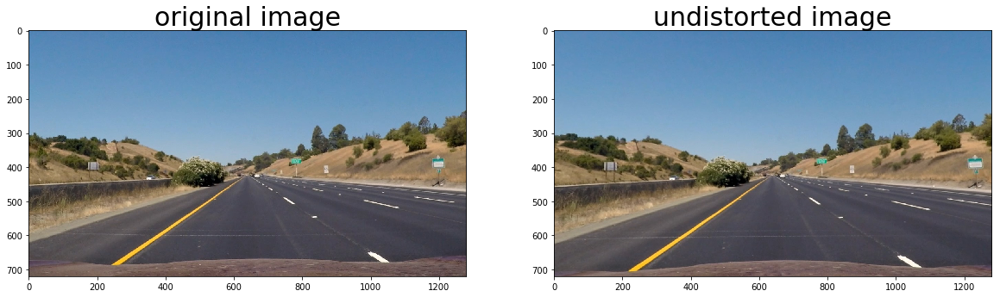

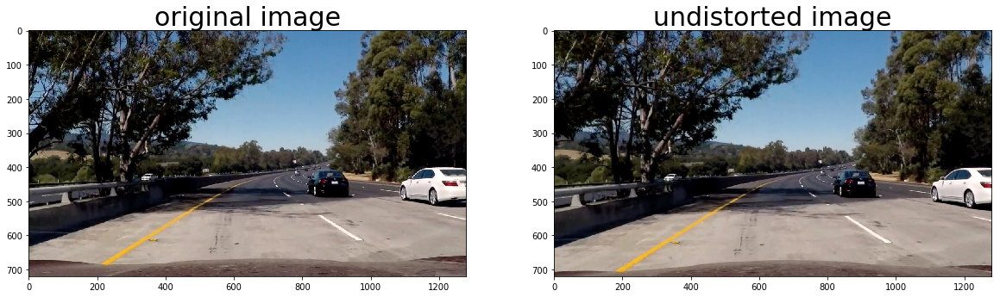

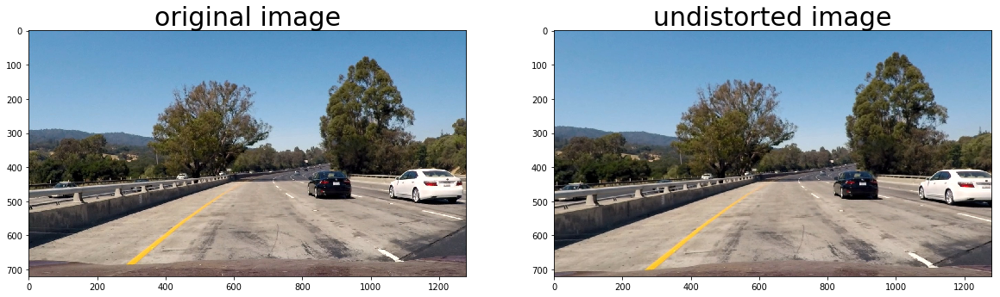

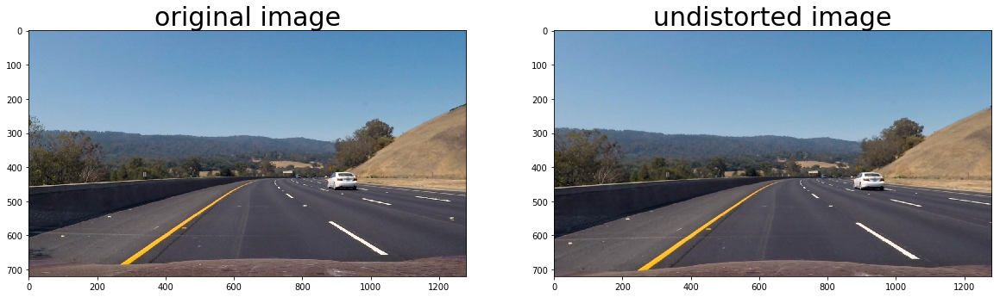

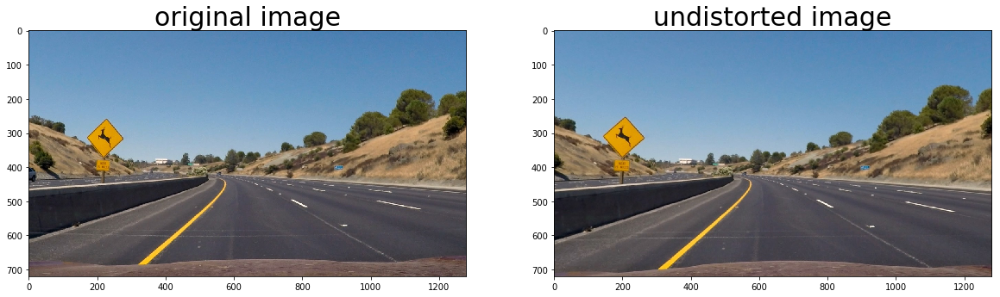

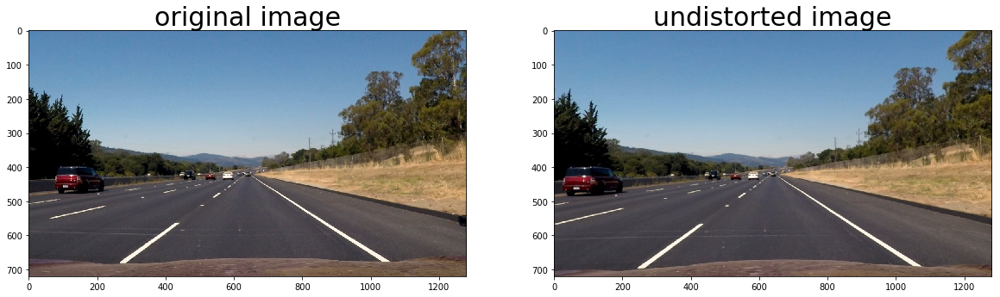

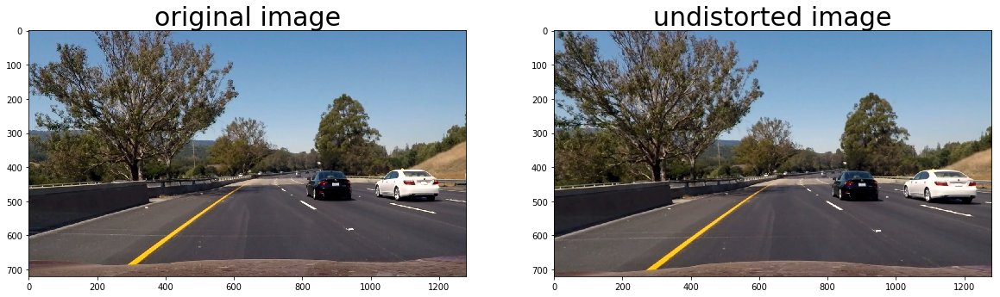

In [41]:
images = glob.glob('test_images/*.jpg')
for image in images:
    undistort(image)

## Step2:Perspective Transform

In this step getPerspectiveTransform() and warpPerspective() used to transform the undistorted image into birds eye view,
which focus only on lane lines and displays both of the lane lines parallel to eachtoher.
Bird eye view will be easy to calculate the radius of curvature and find the lane curves and fitting it bak to original image.

In [42]:
#This function performs pespective trasnform
def birds_eye(image,display=True,read=True):
    if read:
        undist=undistort(image,show=False)
    else:
        undist=undistort(image,show=False,read=False)
    imagesize=undist.shape
    #define the source points
    src=np.float32([[490,482],[810,482],
                    [1250,720],[40,720]])
    #define the destination points
    dst=np.float32([[0,0],[1280,0],
                    [1250,720],[40,720]])
    M=cv2.getPerspectiveTransform(src,dst)
    warped=cv2.warpPerspective(undist,M,imagesize[1::-1],)
    if display:
        f,(ax1,ax2)=plt.subplots(1,2,figsize=(20,10))
        ax1.imshow(undist)
        ax1.set_title('undistorted image',fontsize=30)
        ax2.imshow(warped)
        ax2.set_title('warped image',fontsize=30)
    else:
        return warped,M
    


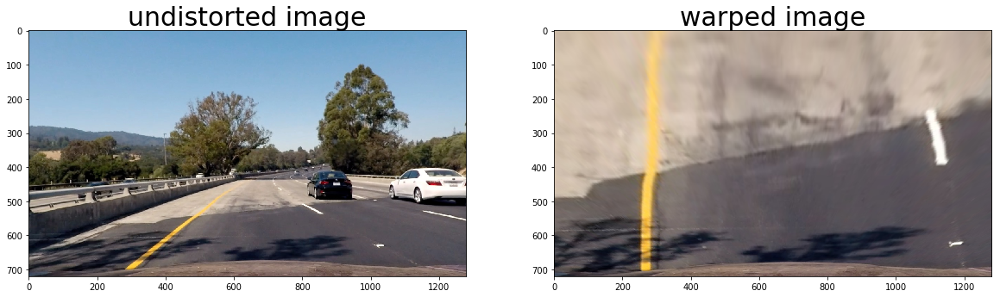

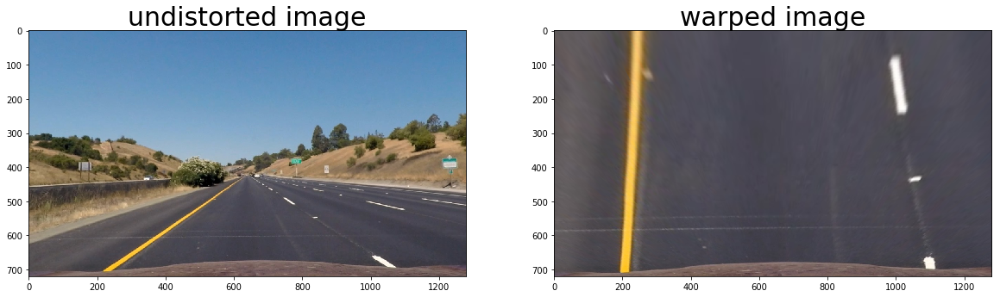

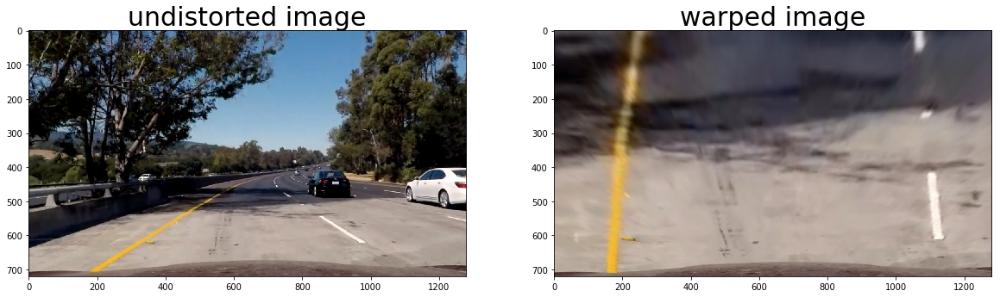

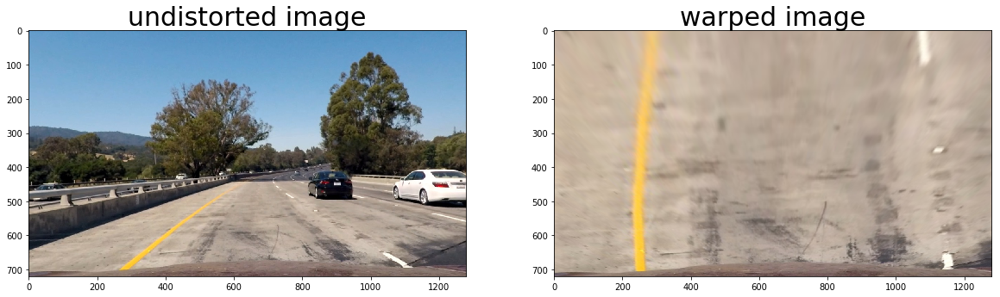

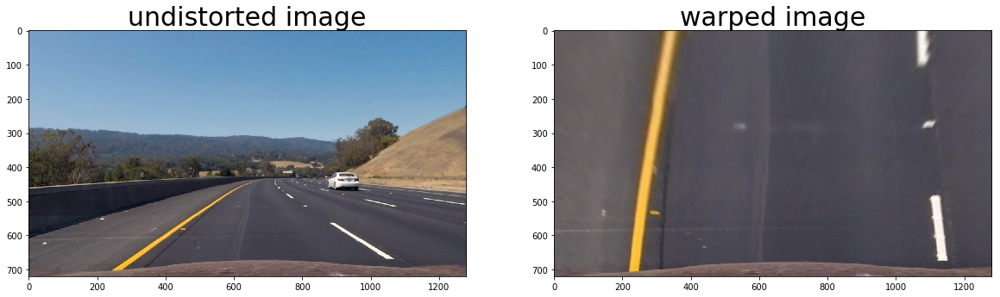

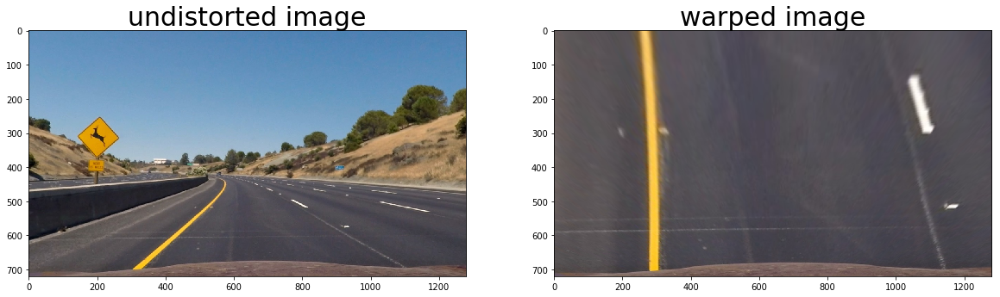

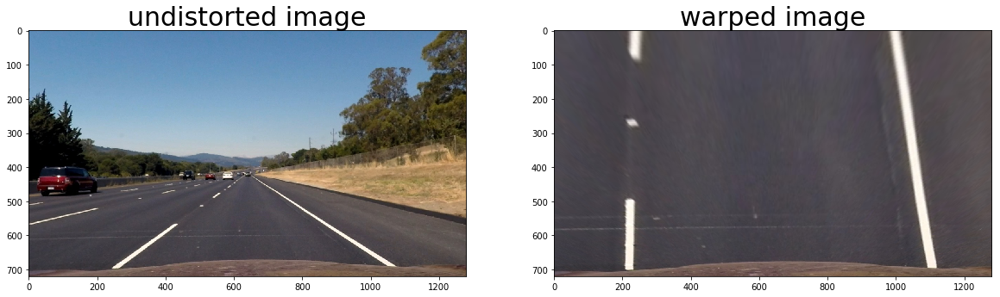

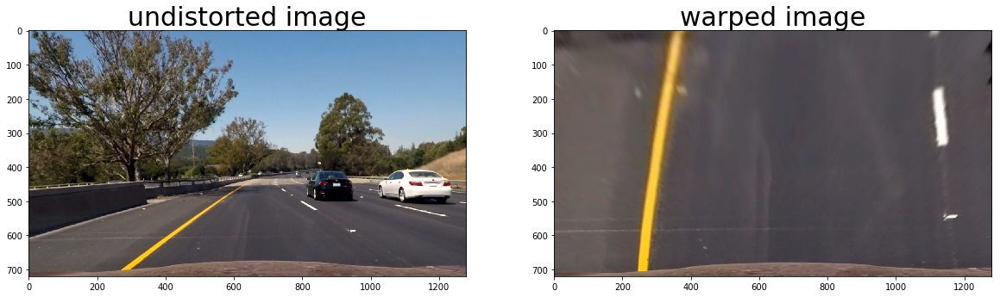

In [43]:
images = glob.glob('test_images/*.jpg')
for image in images:
    birds_eye(image) 

## Step 3: Applying binary thresholds

In this step tried converting to different Gradients and color spaces which detect both yellow and white lanes and ignores rest of of pixels. Filtered lanelines alone by setting a threshold value for color spaces and gradients and assigned them to binary values. The S-Channel from HLS-Color space detects both white and yellow lines, but in shadow region it provides noisy signals.
The sobel operator does not find edges of lanes in lighter region and creating noises in shadow region. The L-Channel from LUV color space find s the white lines, but ignores the yellow lines in lighter region. And B-channel from LAB color space finds the yellow lines, but could not finds the whiteline.
I created the combined binary by selecting only L-channel from LUV space and B-channel from LAB space, because it almost finds both the yellow and white lines and creates less noise.

In [44]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
def apply_threshold(image,s_threshold,sobelxthreshold,l_threshold,b_threshold,show=True):
    image,M=birds_eye(image,display=False)
    #convert to HLS colorspace
    hls=cv2.cvtColor(image,cv2.COLOR_RGB2HLS)
    #onvert to LUV colorspace
    luv=cv2.cvtColor(image,cv2.COLOR_RGB2LUV)
    #convert to LAB colorspace
    lab=cv2.cvtColor(image,cv2.COLOR_RGB2LAB)
    #convert to grayscale
    gray=cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    #isolate s_channel from HLS colorspace
    s_channel=hls[:,:,2]
    #isolate l_channel from LUV colorspace
    l_channel=luv[:,:,0]
    #isolate b_channel from LAB colorspace
    b_channel=lab[:,:,2]
    #taking sobel_x gradient for lane edge detection
    sobelx=cv2.Sobel(gray,cv2.CV_64F,1,0)
    #calculates absolute value of x derivative
    abs_sobelx=np.absolute(sobelx)
    #convert absolute value to 8 bit image 
    scaled_sobel=np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    #creating an array with zero values to the size of scaled sobel
    sxbinary=np.zeros_like(scaled_sobel)
    #create a binary image of 1-threshold met, otherwise 0
    sxbinary[(scaled_sobel >= sobelxthreshold[0]) & (scaled_sobel <= sobelxthreshold[1])] = 1
    s_binary =  np.zeros_like(s_channel)
    #s-channel binary image
    s_binary[(s_channel >= s_threshold[0]) & (s_channel <= s_threshold[1])] = 1
    #l-channel binary image
    l_binary =  np.zeros_like(l_channel)
    l_binary[(l_channel >= l_threshold[0]) & (l_channel <= l_threshold[1])] = 1
    #b-channel binary image
    b_binary =  np.zeros_like(b_channel)
    b_binary[(b_channel >= b_threshold[0]) & (b_channel <= b_threshold[1])] = 1
    #combined binary image of l-channel and b-channel, because l-channel detects whiteline well and b-channel detects yellow line well
    combined_binary = np.zeros_like(l_binary)
    combined_binary[(l_binary == 1) | (b_binary==1)] = 1
    if show==True:
        f,(ax1,ax2,ax3,ax4,ax5,ax6)=plt.subplots(1,6,figsize=(24,9))
        ax1.imshow(image,cmap='gray')
        ax1.set_title('image',fontsize=10)
        ax2.imshow(s_binary,cmap='gray')
        ax2.set_title('s_binary',fontsize=10)
        ax3.imshow(sxbinary,cmap='gray')
        ax3.set_title('sxbinary',fontsize=10)
        ax4.imshow(l_binary,cmap='gray')
        ax4.set_title('l_binary',fontsize=10)
        ax5.imshow(b_binary,cmap='gray')
        ax5.set_title('b_binary',fontsize=10)
        ax6.imshow(combined_binary,cmap='gray')
        ax6.set_title('combined_binary',fontsize=10)
    else:
        return combined_binary


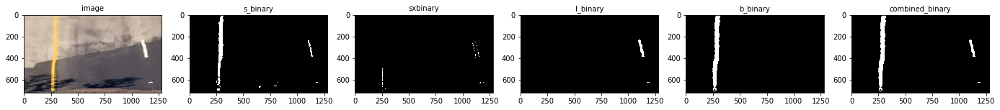

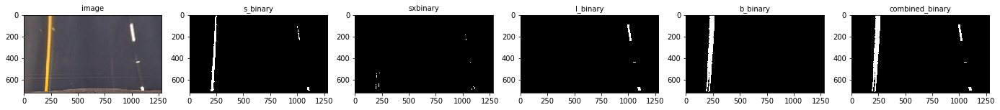

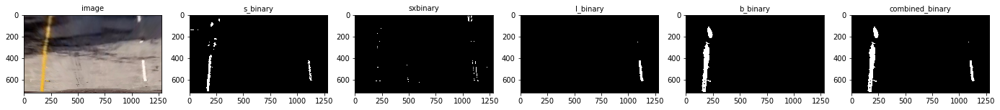

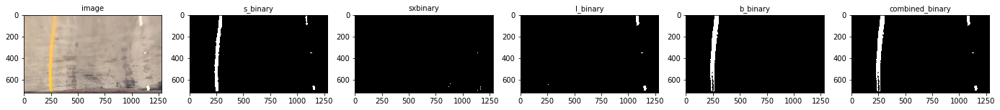

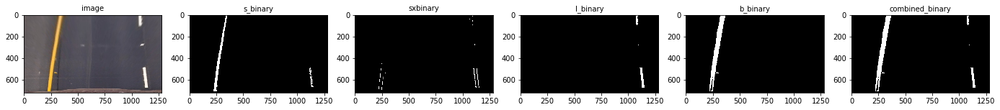

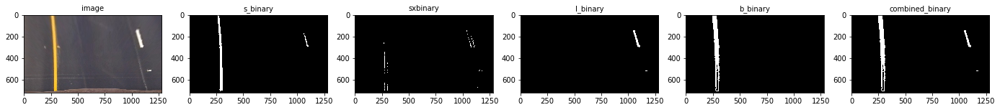

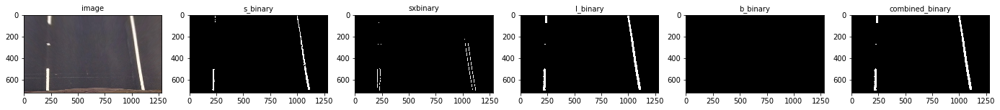

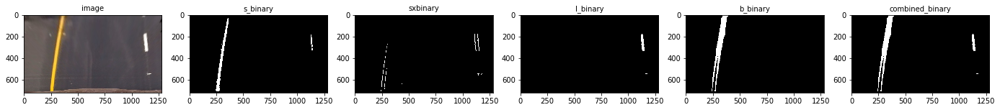

In [45]:
images = glob.glob('test_images/*.jpg')
for image in images:
    result=apply_threshold(image,(170,255),(80,255),(225,255),(155,200))

## Step 4,5: Fit polynomial curve to lane lines and calculate radius of curvature and vehicle position

In this step fitting a polynomial curve to each of lane lines using combined binary image.
The position of vehicle measured by taking avg of x intercepts of each line.

In [46]:
def fill_lane(image):
    combined_binary = apply_threshold(image,(170,255),(80,255),(225,255),(155,200),show=False)
    #empty lists to accomodate left and right line pixel positions
    rightx = []
    righty = []
    leftx = []
    lefty = []
    #identify x and y positions of all nonzero pixels in image
    x, y = np.nonzero(np.transpose(combined_binary))
    #taking histogram of bottom half of image
    bottomhalf=combined_binary[combined_binary.shape[0]//2:,:]
    histogram1=np.sum(bottomhalf,axis=0)
    midpoint=np.int(histogram1.shape[0]//2)
    i = combined_binary.shape[0]
    j = midpoint-10
    while j >= 0:
        histogram = np.sum(combined_binary[j:i,:], axis=0)
        #find peak of left and right halves of histogram
        #these will be the starting point for left and right lines
        left_peak = np.argmax(histogram[:midpoint])
        #identify non zero pixels in x and y
        x_idx = np.where((((left_peak - 25) < x)&(x < (left_peak + 25))&((y > j) & (y < i))))
        #calculate window size
        x_window, y_window = x[x_idx], y[x_idx]
        if np.sum(x_window) != 0:
            leftx.extend(x_window.tolist())
            lefty.extend(y_window.tolist())

        right_peak = np.argmax(histogram[midpoint:]) + midpoint
        x_idx = np.where((((right_peak - 25) < x)&(x < (right_peak + 25))&((y > j) & (y < i))))
        x_window, y_window = x[x_idx], y[x_idx]
        if np.sum(x_window) != 0:
            rightx.extend(x_window.tolist())
            righty.extend(y_window.tolist())
        i -= 90
        j -= 90

    lefty = np.array(lefty).astype(np.float32)
    leftx = np.array(leftx).astype(np.float32)
    righty = np.array(righty).astype(np.float32)
    rightx = np.array(rightx).astype(np.float32)
    #fit a second order polynomial to left and right fit using 'np.polyfit()'
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    right_fit = np.polyfit(righty, rightx, 2)
    #calculate polynomials using left and right fir
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    #calculate intercepts
    rightx_int = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    #Add averaged intercepts to current x and y values
    rightx = np.append(rightx,rightx_int)
    righty = np.append(righty, 720)
    rightx = np.append(rightx,right_fit[0]*0**2 + right_fit[1]*0 + right_fit[2])
    righty = np.append(righty, 0)
    leftx_int = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    leftx = np.append(leftx, leftx_int)
    lefty = np.append(lefty, 720)
    leftx = np.append(leftx,left_fit[0]*0**2 + left_fit[1]*0 + left_fit[2])
    lefty = np.append(lefty, 0)
    #sort detected pixels
    lsort = np.argsort(lefty)
    rsort = np.argsort(righty)
    lefty = lefty[lsort]
    leftx = leftx[lsort]
    righty = righty[rsort]
    rightx = rightx[rsort]
    #fit new polynomials
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    
    # Measure Radius of Curvature for each lane line
    ym_per_pix = 30./720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_cr[0]*np.max(lefty) + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*np.max(lefty) + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])
    
    
    # Calculate the position of the vehicle
    center = abs(640 - ((rightx_int+leftx_int)/2))
    
    offset = 0 
    img_size = (combined_binary.shape[1], combined_binary.shape[0])
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[40, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    Minv = cv2.getPerspectiveTransform(dst, src)
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, lefty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, righty]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp = cv2.warpPerspective(color_warp, Minv, (combined_binary.shape[1], combined_binary.shape[0]))
    result = cv2.addWeighted(mpimg.imread(image), 1, newwarp, 0.5, 0)
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(9, 6))
    ax1.imshow(birds_eye(image, display=False)[0],cmap='gray')
    ax1.set_xlim(0, 1280)
    ax1.set_ylim(0, 720)
    ax1.plot(left_fitx, lefty, color='green', linewidth=3)
    ax1.plot(right_fitx, righty, color='green', linewidth=3)
    ax1.set_title('poly fit to Lane Lines', fontsize=16)
    ax1.invert_yaxis() # to visualize as we do the images
    ax2.imshow(result)
    ax2.set_title('Fill poly Between lanes', fontsize=16)
    if center < 640:
        ax2.text(200, 100, 'Vehicle is {:.2f}m left of center'.format(center*3.7/700),
                 style='italic', color='white', fontsize=10)
    else:
        ax2.text(200, 100, 'Vehicle is {:.2f}m right of center'.format(center*3.7/700),
                 style='italic', color='white', fontsize=10)
    ax2.text(200, 175, 'Radius of curvature is {}m'.format(int((left_curverad + right_curverad)/2)),
             style='italic', color='white', fontsize=10)

## step6: Display detected lane boundaries back to original image and Radius of curvature, vehicle position with respect to center

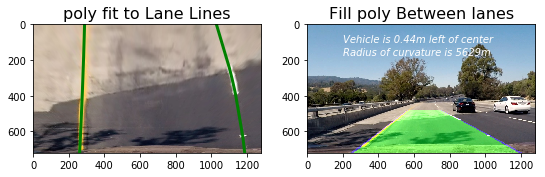

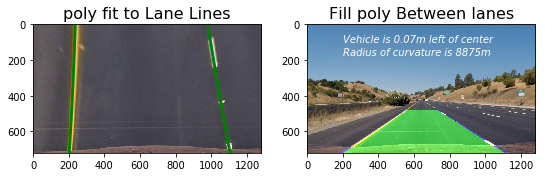

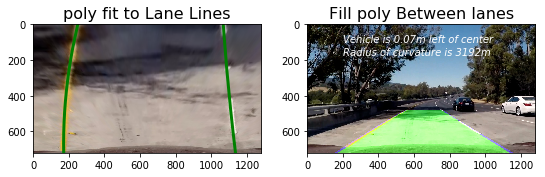

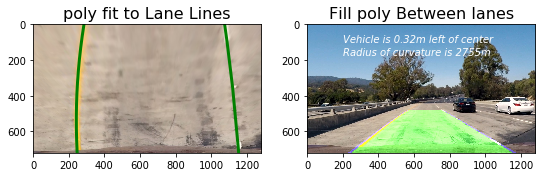

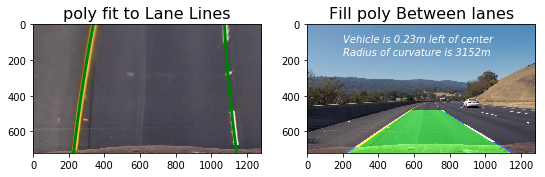

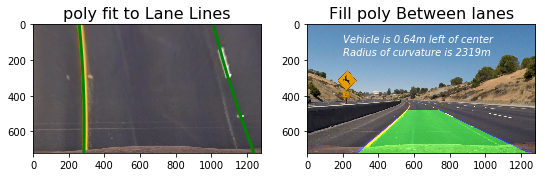

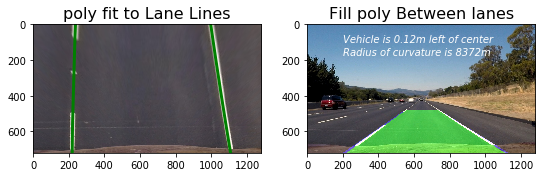

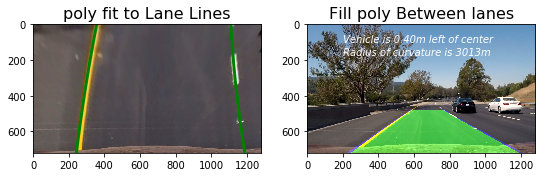

In [47]:
images = glob.glob('test_images/*.jpg')
for image in images:
    fill_lane(image)

## Video processing pipline

Define Line class for storing Data

In [48]:
class Line:
    def __init__(self):
        # Was the line found in the previous frame?
        self.found = False
        
        # Remember x and y values of lanes in previous frame
        self.X = None
        self.Y = None
        
        # Store recent x intercepts for averaging across frames
        self.x_int = deque(maxlen=10)
        self.top = deque(maxlen=10)
        
        # Remember previous x intercept to compare against current one
        self.lastx_int = None
        self.last_top = None
        
        # Remember radius of curvature
        self.radius = None
        
        # Store recent polynomial coefficients for averaging across frames
        self.fit0 = deque(maxlen=10)
        self.fit1 = deque(maxlen=10)
        self.fit2 = deque(maxlen=10)
        self.fitx = None
        self.pts = []
        
        # Count the number of frames
        self.count = 0
        
    def found_search(self, x, y):
        '''
        This function is applied when the lane lines have been detected in the previous frame.
        It uses a sliding window to search for lane pixels in close proximity (+/- 25 pixels in the x direction)
        around the previous detected polynomial. 
        '''
        xvals = []
        yvals = []
        if self.found == True: 
            i = 720
            j = 630
            while j >= 0:
                yval = np.mean([i,j])
                xval = (np.mean(self.fit0))*yval**2 + (np.mean(self.fit1))*yval + (np.mean(self.fit2))
                x_idx = np.where((((xval - 25) < x)&(x < (xval + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    np.append(xvals, x_window)
                    np.append(yvals, y_window)
                i -= 90
                j -= 90
        if np.sum(xvals) == 0: 
            self.found = False # If no lane pixels were detected then perform blind search
        return xvals, yvals, self.found
    
    def blind_search(self, x, y, image):
        '''
        This function is applied in the first few frames and/or if the lane was not successfully detected
        in the previous frame. It uses a slinding window approach to detect peaks in a histogram of the
        binary thresholded image. Pixels in close proimity to the detected peaks are considered to belong
        to the lane lines.
        '''
        xvals = []
        yvals = []
        if self.found == False: 
            i = 720
            j = 630
            while j >= 0:
                histogram = np.sum(image[j:i,:], axis=0)
                if self == Right:
                    peak = np.argmax(histogram[640:]) + 640
                else:
                    peak = np.argmax(histogram[:640])
                x_idx = np.where((((peak - 25) < x)&(x < (peak + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    xvals.extend(x_window)
                    yvals.extend(y_window)
                i -= 90
                j -= 90
        if np.sum(xvals) > 0:
            self.found = True
        else:
            yvals = self.Y
            xvals = self.X
        return xvals, yvals, self.found
    
    def radius_of_curvature(self, xvals, yvals):
        ym_per_pix = 30./720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        fit_cr = np.polyfit(yvals*ym_per_pix, xvals*xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*np.max(yvals) + fit_cr[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr[0])
        return curverad
    
    def sort_vals(self, xvals, yvals):
        sorted_index = np.argsort(yvals)
        sorted_yvals = yvals[sorted_index]
        sorted_xvals = xvals[sorted_index]
        return sorted_xvals, sorted_yvals
    
    def get_intercepts(self, polynomial):
        bottom = polynomial[0]*720**2 + polynomial[1]*720 + polynomial[2]
        top = polynomial[0]*0**2 + polynomial[1]*0 + polynomial[2]
        return bottom, top

This part is similar to poly fit() function which is used for images.

In [54]:
def process_vid(image):
    img_size = (image.shape[1], image.shape[0])
    
    # Calibrate camera and undistort image
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    
    # Perform perspective transform
    offset = 0
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[0, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undist, M, img_size)
    
    # Generate binary thresholded images
    b_channel = cv2.cvtColor(warped, cv2.COLOR_RGB2Lab)[:,:,2]
    l_channel = cv2.cvtColor(warped, cv2.COLOR_RGB2LUV)[:,:,0]  
    
    # Set the upper and lower thresholds for the b channel
    b_thresh_min = 145
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    
    # Set the upper and lower thresholds for the l channel
    l_thresh_min = 215
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1

    combined_binary = np.zeros_like(b_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1
    
    # Identify all non zero pixels in the image
    x, y = np.nonzero(np.transpose(combined_binary)) 

    if Left.found == True: # Search for left lane pixels around previous polynomial
        leftx, lefty, Left.found = Left.found_search(x, y)
        
    if Right.found == True: # Search for right lane pixels around previous polynomial
        rightx, righty, Right.found = Right.found_search(x, y)

            
    if Right.found == False: # Perform blind search for right lane lines
        rightx, righty, Right.found = Right.blind_search(x, y, combined_binary)
            
    if Left.found == False:# Perform blind search for left lane lines
        leftx, lefty, Left.found = Left.blind_search(x, y, combined_binary)

    lefty = np.array(lefty).astype(np.float32)
    leftx = np.array(leftx).astype(np.float32)
    righty = np.array(righty).astype(np.float32)
    rightx = np.array(rightx).astype(np.float32)
            
    # Calculate left polynomial fit based on detected pixels
    left_fit = np.polyfit(lefty, leftx, 2)
    
    # Calculate intercepts to extend the polynomial to the top and bottom of warped image
    leftx_int, left_top = Left.get_intercepts(left_fit)
    
    # Average intercepts across n frames
    Left.x_int.append(leftx_int)
    Left.top.append(left_top)
    leftx_int = np.mean(Left.x_int)
    left_top = np.mean(Left.top)
    Left.lastx_int = leftx_int
    Left.last_top = left_top
    
    # Add averaged intercepts to current x and y vals
    leftx = np.append(leftx, leftx_int)
    lefty = np.append(lefty, 720)
    leftx = np.append(leftx, left_top)
    lefty = np.append(lefty, 0)
    
    # Sort detected pixels based on the yvals
    leftx, lefty = Left.sort_vals(leftx, lefty)
    
    Left.X = leftx
    Left.Y = lefty
    
    # Recalculate polynomial with intercepts and average across n frames
    left_fit = np.polyfit(lefty, leftx, 2)
    Left.fit0.append(left_fit[0])
    Left.fit1.append(left_fit[1])
    Left.fit2.append(left_fit[2])
    left_fit = [np.mean(Left.fit0), 
                np.mean(Left.fit1), 
                np.mean(Left.fit2)]
    
    # Fit polynomial to detected pixels
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    Left.fitx = left_fitx
    
    # Calculate right polynomial fit based on detected pixels
    right_fit = np.polyfit(righty, rightx, 2)

    # Calculate intercepts to extend the polynomial to the top and bottom of warped image
    rightx_int, right_top = Right.get_intercepts(right_fit)
    
    # Average intercepts across 5 frames
    Right.x_int.append(rightx_int)
    rightx_int = np.mean(Right.x_int)
    Right.top.append(right_top)
    right_top = np.mean(Right.top)
    Right.lastx_int = rightx_int
    Right.last_top = right_top
    rightx = np.append(rightx, rightx_int)
    righty = np.append(righty, 720)
    rightx = np.append(rightx, right_top)
    righty = np.append(righty, 0)
    
    # Sort right lane pixels
    rightx, righty = Right.sort_vals(rightx, righty)
    Right.X = rightx
    Right.Y = righty
    
    # Recalculate polynomial with intercepts and average across n frames
    right_fit = np.polyfit(righty, rightx, 2)
    Right.fit0.append(right_fit[0])
    Right.fit1.append(right_fit[1])
    Right.fit2.append(right_fit[2])
    right_fit = [np.mean(Right.fit0), np.mean(Right.fit1), np.mean(Right.fit2)]
    
    # Fit polynomial to detected pixels
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    Right.fitx = right_fitx
        
    # Compute radius of curvature for each lane in meters
    left_curverad = Left.radius_of_curvature(leftx, lefty)
    right_curverad = Right.radius_of_curvature(rightx, righty)
        
    # Only print the radius of curvature every 3 frames for improved readability
    if Left.count % 3 == 0:
        Left.radius = left_curverad
        Right.radius = right_curverad
        
    # Calculate the vehicle position relative to the center of the lane
    position = (rightx_int+leftx_int)/2
    distance_from_center = abs((640 - position)*3.7/700) 
                
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([Left.fitx, Left.Y])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, Right.Y]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_(pts), (34,255,34))
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0]))
    result = cv2.addWeighted(undist, 1, newwarp, 0.5, 0)
        
    # Print distance from center on video
    if position > 640:
        cv2.putText(result, 'Vehicle is {:.2f}m left of center'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    else:
        cv2.putText(result, 'Vehicle is {:.2f}m right of center'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    # Print radius of curvature on video
    cv2.putText(result, 'Radius of Curvature {}(m)'.format(int((Left.radius+Right.radius)/2)), (120,140),
             fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    Left.count += 1
    return result

In [55]:
Left = Line()
Right = Line()
video_output = 'result.mp4'
clip1 = VideoFileClip("project_video.mp4").subclip(3,12)
white_clip = clip1.fl_image(process_vid) 
white_clip.write_videofile(video_output, audio=False)



[MoviePy] >>>> Building video result.mp4
[MoviePy] Writing video result.mp4


100%|█████████▉| 225/226 [02:54<00:00,  1.29it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: result.mp4 



Result for project video

In [56]:
from IPython.display import HTML
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('result.mp4'))


In [30]:
LLeft = Line()
Right = Line()
challenge_output = 'challenge_result.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
challenge_clip = clip1.fl_image(process_vid) 
challenge_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video challenge_result.mp4
[MoviePy] Writing video challenge_result.mp4


100%|██████████| 485/485 [05:44<00:00,  1.38it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_result.mp4 



In [31]:

HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('challenge_result.mp4'))
